In [1]:
# Add imports here
from tgmage import *

# Edit the font, font size, and axes width
plt.rcParams['font.size'] = 10
plt.rcParams['axes.linewidth'] = 1

In [2]:
# Load data
density = np.load("Figure_1_data.npy")


, warmup: 100

Tg:  689.6677846058896


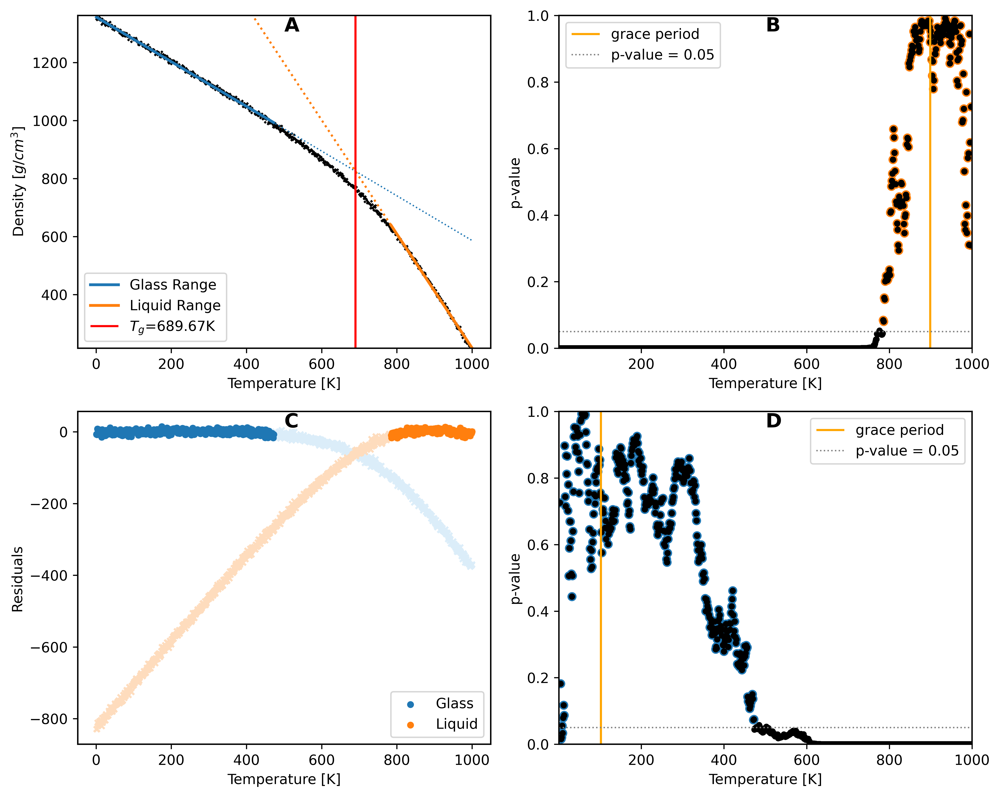

In [3]:
# Old Method
Tf = Tg_finder(density, '', warmup=100, verbose=1, save=".")

Parameters of analysis

In [4]:
# Paremeters
MY_ILs = ['Bmim_NTf2', 'Bmim_TFO', 'Emim_NTf2', 'Emim_Cl', 'Emim_PF6', 'Emim_BF4']
Tg = {}
methods = ["density"]
warmups = [30]

Analysis of My simulated systems


Bmim_NTf2, warmup: 30


/afs/crc.nd.edu/user/f/fcarmona/.local/lib/python3.9/site-packages/scipy/stats/_morestats.py:1761: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")



Tg:  206.7788720064546

Bmim_TFO, warmup: 30

Tg:  220.22862126696634

Emim_NTf2, warmup: 30

Tg:  211.02709326011936

Emim_Cl, warmup: 30

Tg:  225.94238345613624

Emim_PF6, warmup: 30

Tg:  215.47810116411546

Emim_BF4, warmup: 30

Tg:  224.2744331227357


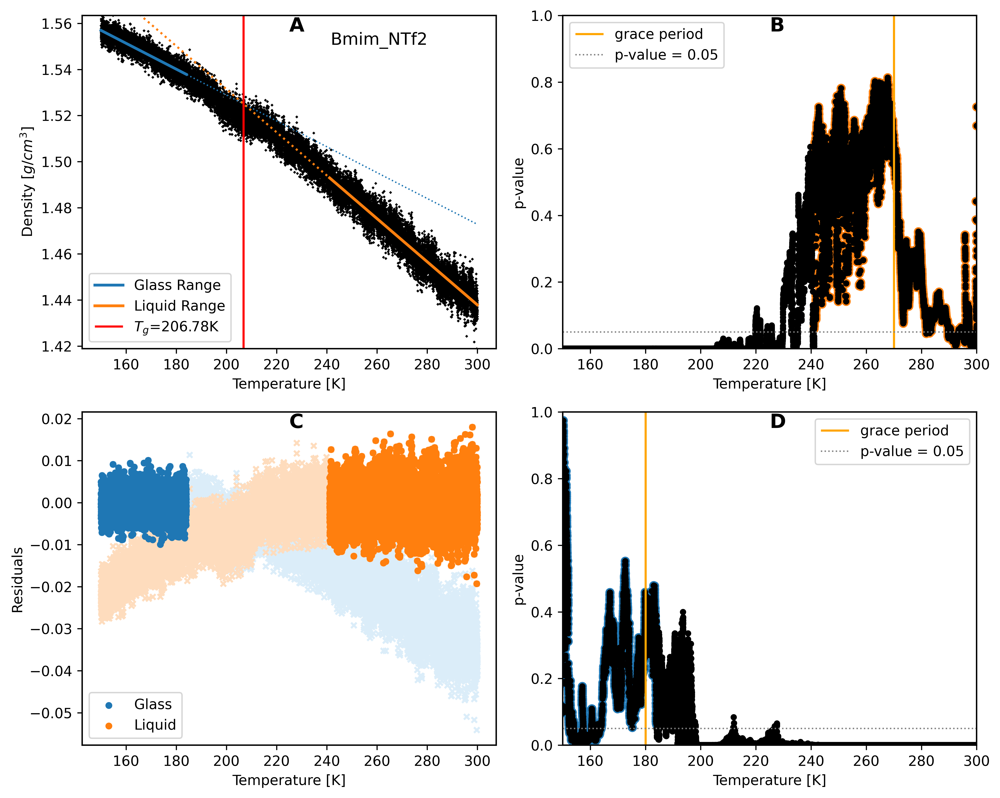

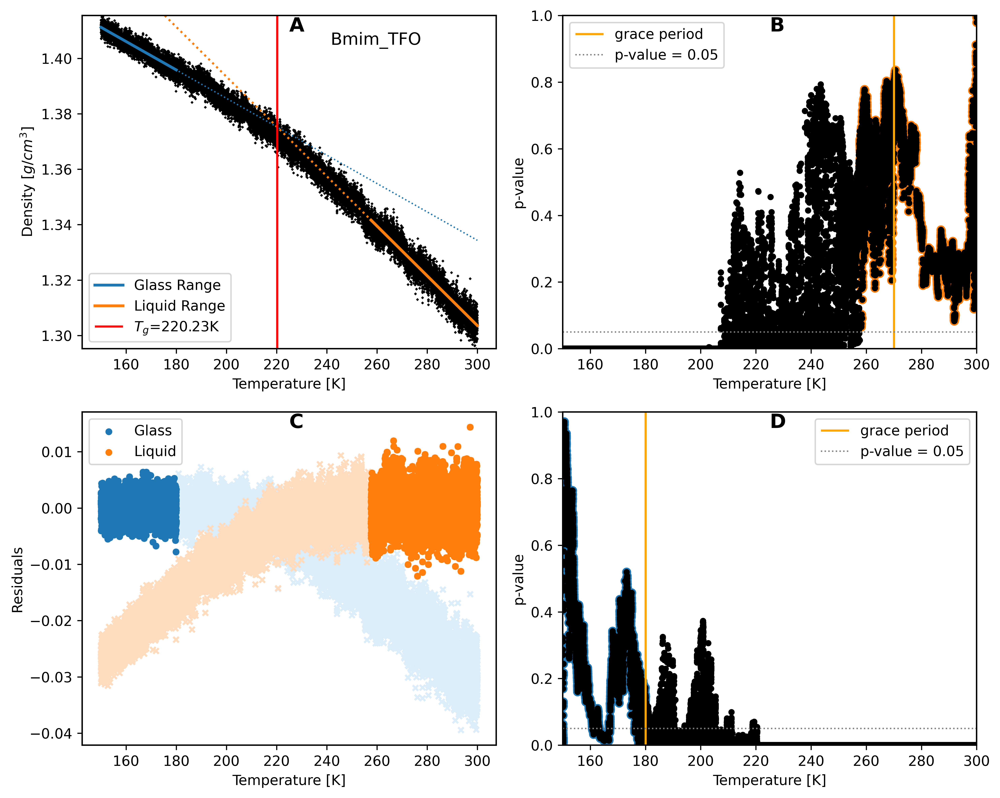

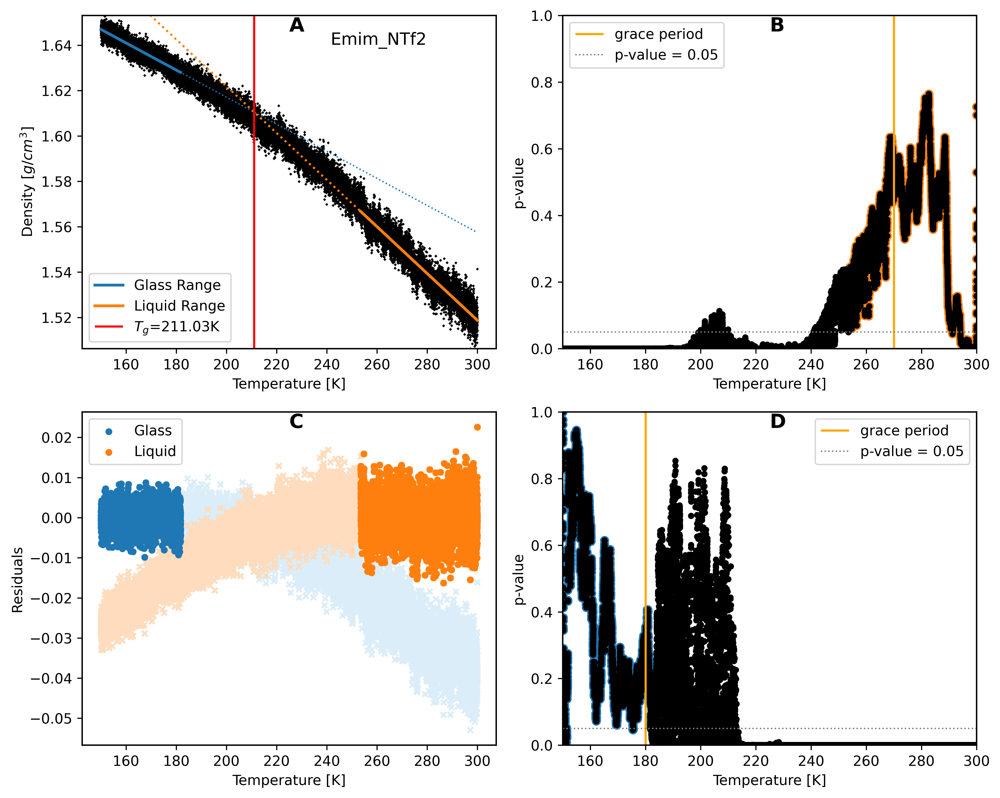

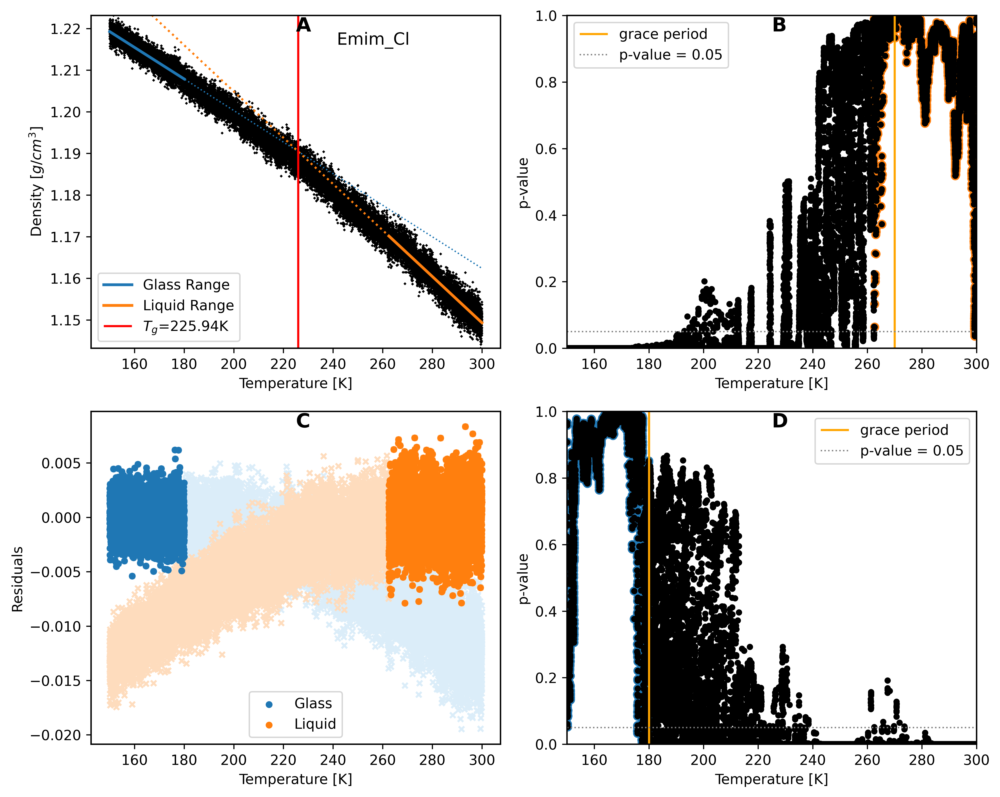

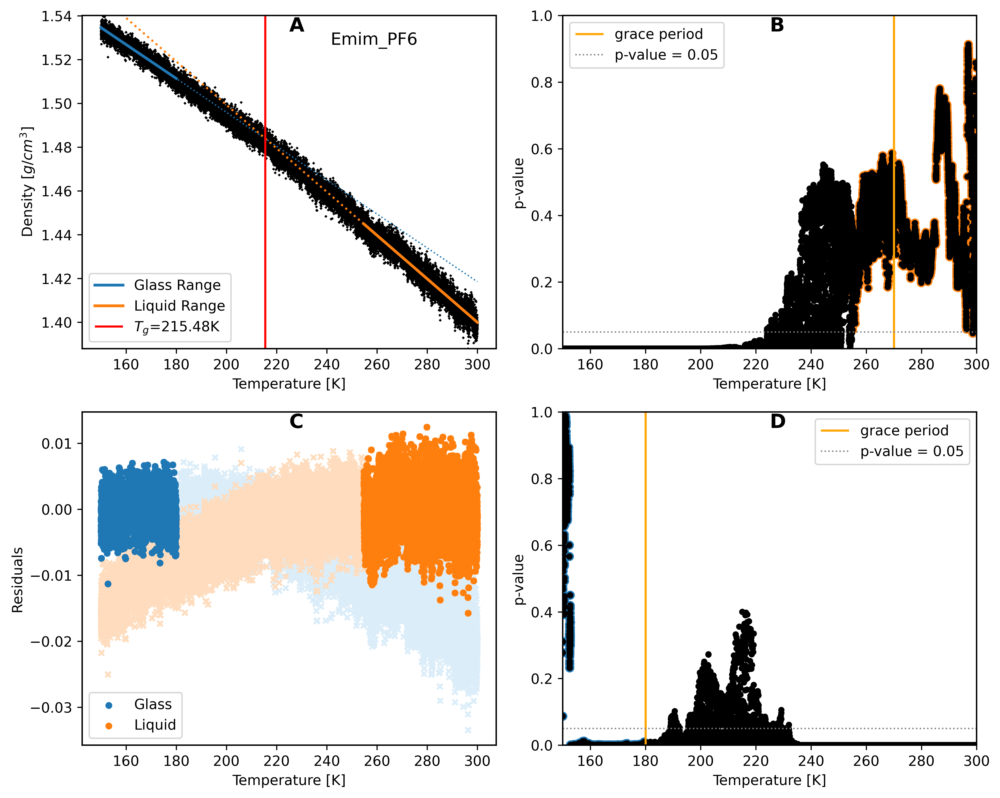

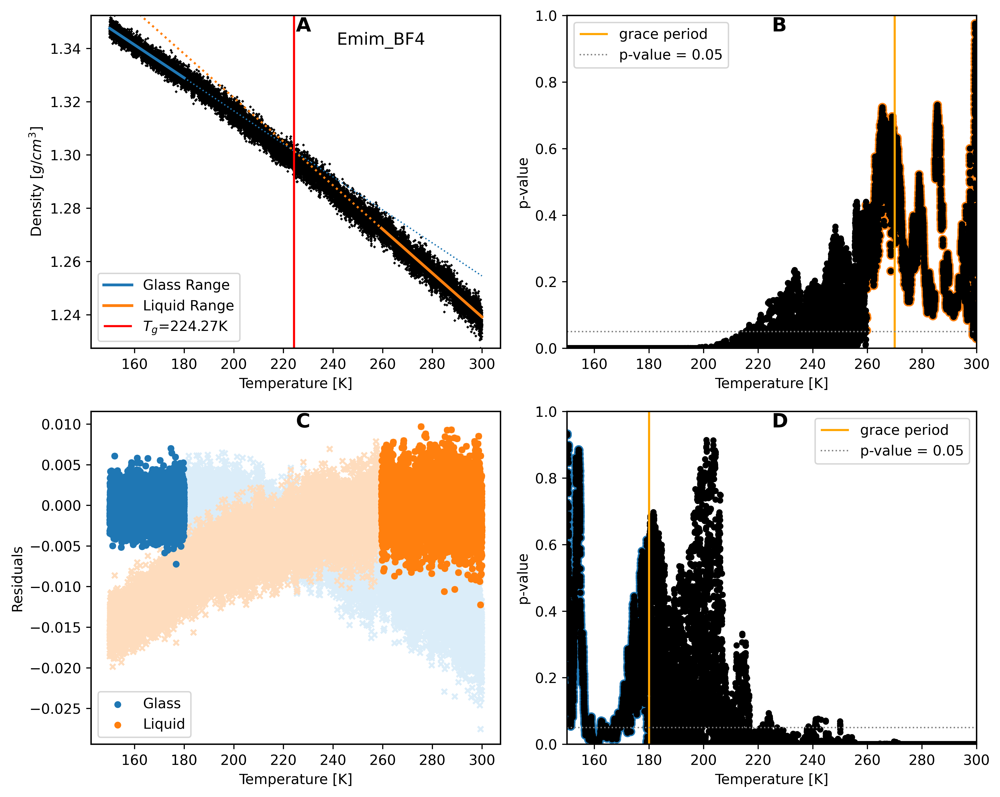

In [5]:
# Load and compute Tg
for il, IL in enumerate(MY_ILs):
    Tg[IL] = {}
    path = f"./data/{IL}"
    # print(path)

    # Load Data 
    density, header_list = thermo_extractor(f"{path}/5K-ns_thermo.txt", wanted_property="Density")
    
    # Temperature Ramp
    T_start = 300
    T_low = 150
    thermostat = np.linspace(T_start, T_low, num=len(density[1]))

    # Construct Density temperature data 
    density[0] = thermostat  
    
    # Flip 
    density = np.flip(density, axis=1)
        
    # Compute Tg with new method V2 
    for warmup in warmups:
        Tg[IL][warmup] = Tg_finder(density, IL, 0.05, warmup, verbose=1, save='.')
        
    # Save everytime
    f = open("Tg.pkl","wb")          
    pickle.dump(Tg,f) # write the python object (dict) to pickle file
    f.close() # close file